In [31]:
import xarray as xr
# open the 'LGMR_GMST_ens.nc' file
ds_sat = xr.open_dataset('data/LGMR_SAT_climo.nc')
ds_sat

c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


<xarray.Dataset>
Dimensions:  (lat: 96, lon: 144, age: 120)
Coordinates:
  * lat      (lat) float32 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * age      (age) float32 100.0 300.0 500.0 ... 2.35e+04 2.37e+04 2.39e+04
Data variables:
    sat      (age, lat, lon) float32 ...
    sat_std  (age, lat, lon) float32 ...

In [6]:
import numpy as np
weight = np.cos(np.deg2rad(ds_sat['lat']))
weight

<xarray.DataArray 'lat' (lat: 96)>
array([-4.3711388e-08,  3.3063419e-02,  6.6090614e-02,  9.9045530e-02,
        1.3189226e-01,  1.6459467e-01,  1.9711708e-01,  2.2942394e-01,
        2.6148006e-01,  2.9325014e-01,  3.2469943e-01,  3.5579380e-01,
        3.8649911e-01,  4.1678187e-01,  4.4660890e-01,  4.7594735e-01,
        5.0476557e-01,  5.3303176e-01,  5.6071502e-01,  5.8778524e-01,
        6.1421269e-01,  6.3996857e-01,  6.6502458e-01,  6.8935341e-01,
        7.1292841e-01,  7.3572391e-01,  7.5771487e-01,  7.7887732e-01,
        7.9918796e-01,  8.1862485e-01,  8.3716649e-01,  8.5479271e-01,
        8.7148422e-01,  8.8722283e-01,  9.0199125e-01,  9.1577333e-01,
        9.2855400e-01,  9.4031936e-01,  9.5105654e-01,  9.6075368e-01,
        9.6940029e-01,  9.7698683e-01,  9.8350507e-01,  9.8894787e-01,
        9.9330926e-01,  9.9658448e-01,  9.9877000e-01,  9.9986333e-01,
        9.9986333e-01,  9.9877000e-01,  9.9658448e-01,  9.9330926e-01,
        9.8894787e-01,  9.8350507e-01,  9.7698683e-01,  9.6940029e-01,
        9.6075368e-01,  9.5105654e-01,  9.4031936e-01,  9.2855400e-01,
        9.1577333e-01,  9.0199125e-01,  8.8722283e-01,  8.7148422e-01,
        8.5479271e-01,  8.3716649e-01,  8.1862485e-01,  7.9918796e-01,
        7.7887732e-01,  7.5771487e-01,  7.3572391e-01,  7.1292841e-01,
        6.8935341e-01,  6.6502458e-01,  6.3996857e-01,  6.1421269e-01,
        5.8778524e-01,  5.6071502e-01,  5.3303176e-01,  5.0476557e-01,
        4.7594735e-01,  4.4660890e-01,  4.1678187e-01,  3.8649911e-01,
        3.5579380e-01,  3.2469943e-01,  2.9325014e-01,  2.6148006e-01,
        2.2942394e-01,  1.9711708e-01,  1.6459467e-01,  1.3189226e-01,
        9.9045530e-02,  6.6090614e-02,  3.3063419e-02, -4.3711388e-08],
      dtype=float32)
Coordinates:
  * lat      (lat) float32 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
Attributes:
    FillValue:  9.969209968386869e+36
    long_name:  vector latitudes
    units:      degrees_north

In [10]:
sat = ds_sat['sat'].values

sat_shape = sat.shape

# reshape the sat to a 2D array
sat = sat.reshape(sat_shape[0], sat_shape[1]*sat_shape[2])
sat = sat.T
print(sat.shape)
sat


# sat_scaled = scaler.fit_transform(sat)
# sat_scaled=ds_sat['sat_anomalies'].values
# rwo_mean=np.nanmean(sat,axis=1)

(13824, 120)


array([[-49.57208 , -49.64024 , -49.73038 , ..., -56.378887, -56.31185 ,
        -56.16613 ],
       [-49.421402, -49.47167 , -49.560814, ..., -56.36851 , -56.30149 ,
        -56.155342],
       [-49.554913, -49.617664, -49.706593, ..., -56.385773, -56.31879 ,
        -56.173565],
       ...,
       [-18.328548, -18.336205, -17.916368, ..., -42.61696 , -42.26799 ,
        -41.97171 ],
       [-18.322424, -18.330492, -17.910149, ..., -42.622543, -42.27324 ,
        -41.977016],
       [-18.317688, -18.326065, -17.905447, ..., -42.627247, -42.277664,
        -41.98161 ]], dtype=float32)

In [12]:
rwo_mean=np.nanmean(sat,axis=0)
print(rwo_mean.shape)
rwo_mean

(120,)


array([ 3.3563578 ,  3.234756  ,  3.2597916 ,  3.3346496 ,  3.5002902 ,
        3.4288008 ,  3.3398297 ,  3.3306596 ,  3.267226  ,  3.2524781 ,
        3.2139645 ,  3.2181673 ,  3.2567127 ,  3.1703796 ,  3.0774708 ,
        3.044745  ,  2.9248686 ,  2.9486864 ,  2.8758845 ,  2.8572845 ,
        2.9046109 ,  2.9536726 ,  3.0175161 ,  3.0481339 ,  3.0665464 ,
        3.1320667 ,  3.04619   ,  2.9684439 ,  2.9971445 ,  3.029489  ,
        3.0623062 ,  3.1068072 ,  3.1006703 ,  3.0691497 ,  2.9000347 ,
        2.8665318 ,  2.7779865 ,  2.858534  ,  2.7873974 ,  2.876584  ,
        2.912198  ,  2.8938768 ,  2.8879914 ,  2.665767  ,  2.674963  ,
        2.7410183 ,  2.4168675 ,  2.1787474 ,  2.1727433 ,  2.1068316 ,
        1.8865274 ,  1.8827144 ,  1.9533259 ,  1.8957881 ,  1.7946635 ,
        1.6527139 ,  1.3633208 ,  0.89330775,  0.31598055, -0.33375013,
       -0.54903835, -0.9335019 , -1.3157388 , -1.5547137 , -1.4652772 ,
       -1.2611604 , -1.2791175 , -1.4208162 , -1.5808794 , -1.65

In [30]:
# function to fit a 2D Gaussian mixture model to the 'sat' data variable of an xarray dataset  
# #####################################################################################

import numpy as np
import xarray as xr

def center_data(ds_sat, variable_name):
    """
    Center the specified variable in the given dataset by subtracting its mean.

    Parameters:
    - dataset (xarray.Dataset): The dataset containing the variable to be centered.
    - variable_name (str): The name of the variable to be centered.

    Returns:
    - centered_dataset (xarray.Dataset): The dataset with the centered variable added as a new variable.
    """
    # Calculate the mean along the 'age' axis
    mean_data = ds_sat[variable_name].mean(dim='age')

    # Subtract the mean from the data
    centered_data = ds_sat[variable_name] - mean_data

    # Add the centered_data as a new variable in the dataset
    centered_dataset = ds_sat.assign(**{f'{variable_name}_centered': centered_data})

    return centered_dataset


##########################################################################################
import xarray as xr


def cal_anomalies(ds_sat, years):
    """calculate the temperature anomalies by subtracting the mean over the specified years from the 'sat' data variable of an xarray dataset.

    Parameters
    ----------
    ds_sat : xarray.Dataset
        An xarray dataset containing a 'sat' data variable with dimensions (age, lat, lon).
    years : int
        The number of years to calculate the mean over.

    Returns
    -------
    xarray.Dataset
        The updated xarray dataset with a new 'sat_anomalies' data variable.
    """
    # Select the specified years of the record
    ds_years = ds_sat.sel(age=slice(None, years))

    # Calculate the mean over the specified years
    mean_years = ds_years['sat'].mean(dim='age')

    # Compute the anomalies by subtracting the mean from the 'sat' variable
    anomalies_sat = ds_sat['sat'] - mean_years

    # Add the anomalies as a new data variable in the dataset
    ds_sat['sat_anomalies'] = anomalies_sat

    return ds_sat

###############################################################################
import numpy as np
import xarray as xr
import GMM_functions as gf

def cal_weighted_anomalies(ds_sat):
    """calculate the weighted temperature anomalies by multiplying the 'sat_anomalies' data variable with the weight based on cos(lat).
    Parameters
    ----------
    ds_sat : xarray.Dataset
        An xarray dataset containing a 'sat' data variable with dimensions (age, lat, lon).
        
    Returns
    -------
    xarray.Dataset
        The updated xarray dataset with a new 'sat_anomalies_weighted' data variable.
    """
    ds_sat = cal_anomalies(ds_sat, 2000)
    # Calculate the weight based on cos(lat)
    # weight = np.cosd(ds_sat['lat'])
    weight = np.cos(np.deg2rad(ds_sat['lat']))

    # Multiply 'sat_anomalies' with the weight
    sat_anomalies_weighted = ds_sat['sat_anomalies'] * weight

    # Add 'sat_anomalies_weighted' as a new data variable in the dataset
    ds_sat['sat_anomalies_weighted'] = sat_anomalies_weighted

    return ds_sat

  
################################################################################
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore
import numpy as np
from sklearn.mixture import GaussianMixture
import xarray as xr
import matplotlib.pyplot as plt

colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

def fit_gmm(ds_sat, variable='sat',n_pc=2, n_components=3):
    """Fit a 2D Gaussian mixture model to the 'sat' data variable of an xarray dataset.

    Parameters
    ----------
    ds_sat : xarray.Dataset
        An xarray dataset containing a 'sat' data variable with dimensions (age, lat, lon).
    n_pc : int
        Number of principal components to retain after PCA
    n_components : int
        Number of components in the Gaussian mixture model

    Returns
    -------
    xarray.Dataset
        The updated xarray dataset with a new 'class_label' data variable.

    """
    if n_components > 10:
        raise ValueError('n_components cannot be greater than 10, otherwise the colors will repeat.')
    
    ds_sat = cal_weighted_anomalies(ds_sat)
    # ds_sat = cal_anomalies(ds_sat, 2000)

    # get all the sat from ds_sat and put it to a ndarray
    # sat = ds_sat['sat'].values
    # sat = ds_sat['sat_anomalies_weighted'].values
    sat = ds_sat[variable].values

    sat_shape = sat.shape

    # reshape the sat to a 2D array
    sat = sat.reshape(sat_shape[0], sat_shape[1]*sat_shape[2])
    sat = sat

    # # Normalize the data
    # scaler = StandardScaler()
    # # sat_scaled = scaler.fit_transform(sat)
    # # sat_scaled=ds_sat['sat_anomalies'].values
    # rwo_mean=np.nanmean(sat,axis=1)
    # weight = np.cos(np.deg2rad(ds_sat['lat']))
    # sat_scaled = sat_scaled * weight

    # calculate the mean for each column of the sat
    col_mean = np.mean(sat, axis=0)
    col_mean.shape

    # each column of sat minors the mean of the column
    sat_scaled = sat - col_mean
    sat_scaled.shape


    # PCA
    pca_sat = PCA(n_components=n_pc)
    columns = [f'pc {i}' for i in range(1, n_pc+1)]
    PCs = pca_sat.fit_transform(sat_scaled)

    # calculate the PCA scores for the original unscaled data
    # sat_scores = sat_scaled.T.dot(zscore(PCs))
    sat_scores = sat_scaled.T.dot(PCs)

    # create a 2D GMM model
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full')

    # fit the model to the two columns of PCA scores
    gmm_model.fit(sat_scores)

    # get the predicted class labels for each data point
    class_labels = gmm_model.predict(sat_scores)

    # add the class labels to the xarray dataset
    ds_sat['class_label'] = (('lat', 'lon'), class_labels.reshape(sat_shape[1], sat_shape[2]))

    # plot the results
    fig, ax = plt.subplots(1, 2, figsize=(8, 4), dpi=300)

    # plot the scatter plot of the two columns
    for i in range(n_components):
        mask = class_labels == i
        # ax[0].scatter(sat_scores[:, 0][mask], sat_scores[:, 1][mask], s=10, alpha=0.5, color=colors[i % len(colors)])
        ax[0].scatter(sat_scores[:, 0][mask], sat_scores[:, 1][mask], s=10, alpha=0.5, color=colors[i])

    # plot the contour plot of the fitted GMM
    x, y = np.meshgrid(np.linspace(np.min(sat_scores[:, 0]), np.max(sat_scores[:, 0]), 100),
                       np.linspace(np.min(sat_scores[:, 1]), np.max(sat_scores[:, 1]), 100))
    XX = np.array([x.ravel(), y.ravel()]).T
    Z = -gmm_model.score_samples(XX)
    Z = Z.reshape(x.shape)
    ax[1].contour(x, y, Z, cmap='coolwarm_r')

    # Add labels and title
    ax[0].set_xlabel('PC 1')
    ax[0].set_ylabel('PC 2')
    ax[1].set_xlabel('PC 1')
    ax[1].set_ylabel('PC 2')
    ax[0].set_title('Scatter plot of PCA scores')
    ax[1].set_title('Contour plot of fitted GMM')

    plt.tight_layout()
    plt.show()

    #################################################################################################

# function to plot the class labels on a map

import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def plot_labels(ds):
    sat_label = ds['class_label']

    # create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 5), subplot_kw=dict(projection=ccrs.PlateCarree()),dpi=300)

    # add coastline and gridlines
    ax.add_feature(cfeature.COASTLINE)
    ax.gridlines()

    # plot heatmap
    # cmap = plt.cm.get_cmap('tab20b', len(np.unique(sat_label)))
    # create colormap with unique colors for each class label
    # colors = list(mcolors.CSS4_COLORS.values())
    # colors = list(mcolors.TABLEAU_COLORS.values())
    # print(colors[1:len(np.unique(sat_label))+1])
    # cmap = mcolors.ListedColormap(colors[1:len(np.unique(sat_label))+1])
    cmap = mcolors.ListedColormap(colors[0:len(np.unique(sat_label))])

    im = ax.pcolormesh(ds.lon, ds.lat, sat_label, transform=ccrs.PlateCarree(), cmap=cmap, shading='auto')
    
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
    # add lon and lat labels
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title('Spatial distribution of class labels')

    # add colorbar
    bounds = np.arange(len(np.unique(sat_label))+1) -0.5
    ticks = np.arange(len(np.unique(sat_label)))
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.05, boundaries=bounds, ticks=ticks)
    cbar.ax.set_yticklabels(np.unique(sat_label))
    cbar.ax.set_ylabel('Class Label')

    # set title and show plot
    plt.show()

##############################################################################################
# find the deglacial sequence of each class (label) 

import numpy as np
import xarray as xr


# label2plot=[]
def find_labels_transition(ds,variable='sat'):

    min_age_list=[]
    labels=[]
    classlabel_age=[]
    sequence_class_age=[]

    ds['transition_age_of_label'] = xr.full_like(ds['sat'].isel(age=0), np.nan)
    for label in np.unique(ds['class_label']):
        # label2plot = label
        label_mask = ds['class_label'] == label
        label_sat = ds[variable].where(label_mask)
        label_sat_average = label_sat.mean(dim=('lat', 'lon'))
        min_age = ds['age'].isel(age=label_sat_average.argmin(dim='age'))
        # min_sat = label_sat_average.min(dim='age')
        min_age_list.append(min_age.values)
        labels.append(label)
        classlabel_age.append([label,min_age.values])
        
        age_min_sat = xr.where(label_mask, min_age, np.nan)
        ds['transition_age_of_label'] = ds['transition_age_of_label'].where(~label_mask, age_min_sat)

    # compute sequence
    classlabel_age.sort(key=lambda x: x[1], reverse=True)
    ds['sequence'] = xr.full_like(ds['sat'].isel(age=0), np.nan)
    #min_age_list = np.unique(ds['transition_age_of_label'].values[~np.isnan(ds['transition_age_of_label'].values)])
    # min_age_list.sort()
    # print(min_age_list)
    for i in range(len(classlabel_age)):#enumerate(np.unique(ds['class_label'])):
        label_mask = ds['class_label'] == classlabel_age[i][0]
        sequence_class_age.append([i,classlabel_age[i][0],classlabel_age[i][1]])
        ds['sequence'] = xr.where(label_mask, i, ds['sequence'])
    ds['sequence'] = ds['sequence'].fillna(-2147483648).astype(int)


    # ncol=2
    # nrow=int(np.ceil(len(np.unique(ds['class_label']))/2))
    # fig,ax=plt.subplots(nrow,ncol,figsize=(16,8*nrow))

    # for i in range(len(classlabel_age)):
    #         # get the class label based on the sequence
    #         label2plot = classlabel_age[i][0]
    #         label_mask = ds['class_label'] == label2plot
    #         label_sat = ds['sat'].where(label_mask)
    #         label_sat_average = label_sat.mean(dim=('lat', 'lon'))
    #         min_age = ds['age'].isel(age=label_sat_average.argmin(dim='age'))
    #         min_sat = label_sat_average.min(dim='age')
    #         row=int(i/ncol)
    #         col=i%ncol
    #         ax[row,col].plot(ds.age,label_sat_average,color='red')
    #         ax[row,col].plot(min_age,min_sat,'bo')
    #         ax[row,col].set_xlabel('Age')
    #         ax[row,col].set_ylabel('Sat')
    #         ax[row,col].set_title(f'Class Label: {str(label2plot)}, Sequence: {str(i)}, Age of transition: {str(min_age.values)}')
    # plt.show()

    return ds,sequence_class_age

##############################################################################################
# function to plot the class labels on a map

import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np


def plot_all_label_at_sequence(ds,variable='sat',plot_class=False):
    ds,sequence_class_age=find_labels_transition(ds,variable=variable)
    sequence_label = ds['sequence']
    sat_label = ds['class_label']
    # create a figure and axis
    nrow=len(np.unique(sat_label))
    fig = plt.figure(figsize=(16, 5*nrow),dpi=300)

    for i in np.unique(ds['sequence']):
        label2plot=sequence_class_age[i][1]
        # add coastline and gridlines
        ax = fig.add_subplot(nrow, 2, 2*i+1, projection=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.gridlines()

        # plot heatmap
        # colors = list(mcolors.TABLEAU_COLORS.values())
        # colors = colors[1:len(np.unique(sat_label))+1]
        cmap = mcolors.ListedColormap(['#ffffff', colors[label2plot]])
        im = ax.pcolormesh(ds.lon, ds.lat, sat_label==label2plot, transform=ccrs.PlateCarree(), cmap=cmap, shading='auto')   
        ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
        ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
        # add lon and lat labels
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'Sequence Label: {str(sequence_class_age[i][0])}, Class label: {str(sequence_class_age[i][1])}, Age of transition: {str(int(sequence_class_age[i][2]))}')


    ##########################################
    # calculate average sat data for each label

        label_mask = ds['class_label'] == label2plot
        label_sat = ds[variable].where(label_mask)
        label_sat_average = label_sat.mean(dim=('lat', 'lon'))
        min_age = ds['age'].isel(age=label_sat_average.argmin(dim='age'))
        min_sat = label_sat_average.min(dim='age')

        # create axis for the second plot
        ax1 = fig.add_subplot(nrow, 2, 2*i+2)

        # timing for climate transitions, data from Rasmussen et al., 2014, in b2k
        HS1=np.array([17480,14692])-50 # convert to b1950
        BA=np.array([14692,12896])-50
        YD=np.array([12896,11703])-50

        # plot the timing of climate transitions using vertical lines
        ax1.axvline(x=HS1[0],color='black',linestyle='--') # HS1
        ax1.axvline(x=HS1[1],color='black',linestyle='--') # HS1

        ax1.axvline(x=BA[0],color='black',linestyle='--') # BA
        ax1.axvline(x=BA[1],color='black',linestyle='--') # BA

        ax1.axvline(x=YD[0],color='black',linestyle='--') # YD
        ax1.axvline(x=YD[1],color='black',linestyle='--') # YD

        if plot_class:
            # plot all sat data in the same label as light grey lines
            # reshape the label_sat to a 2D array
            label_sat = label_sat.values
            label_sat = label_sat.reshape(label_sat.shape[0], label_sat.shape[1]*label_sat.shape[2])
            print(label_sat.shape)
            for i in range(label_sat.shape[1]):
                ax1.plot(ds['age'],label_sat[:,i], color='lightgray', alpha=0.1)

        ax1.plot(ds.age,label_sat_average,color=colors[label2plot])
        ax1.plot(min_age,min_sat,'ko')
        # print(np.max(ax1.get_ylim()))
        
        # add labels for the vertical lines
        ax1.text(HS1[0]-0.7*(HS1[0]-HS1[1]),np.max(ax1.get_ylim())-0.1*(np.max(ax1.get_ylim())-np.min(ax1.get_ylim())),'HS1',rotation=90)
        ax1.text(BA[0]-0.7*(BA[0]-BA[1]),np.max(ax1.get_ylim())-0.1*(np.max(ax1.get_ylim())-np.min(ax1.get_ylim())),'BA',rotation=90)
        ax1.text(YD[0]-0.7*(YD[0]-YD[1]),np.max(ax1.get_ylim())-0.1*(np.max(ax1.get_ylim())-np.min(ax1.get_ylim())),'YD',rotation=90)

        ax1.set_xlabel('Age')
        ax1.set_ylabel(f'{variable}')
        #ax1.set_title('Class Label: '+str(label2plot))

    plt.show()



In [5]:
cal_weighted_anomalies(ds_sat)

c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv
c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


<xarray.Dataset>
Dimensions:                 (lat: 96, lon: 144, age: 120)
Coordinates:
  * lat                     (lat) float32 -90.0 -88.11 -86.21 ... 88.11 90.0
  * lon                     (lon) float32 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * age                     (age) float32 100.0 300.0 ... 2.37e+04 2.39e+04
Data variables:
    sat                     (age, lat, lon) float32 ...
    sat_std                 (age, lat, lon) float32 ...
    sat_anomalies           (age, lat, lon) float32 0.2315 0.2506 ... -24.22
    sat_anomalies_weighted  (age, lat, lon) float32 -1.012e-08 ... 1.059e-06

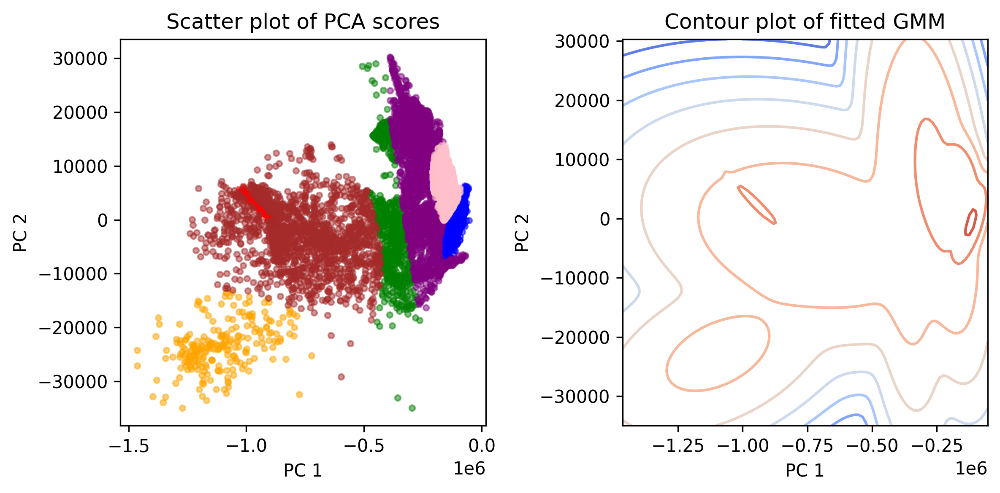

In [45]:
fit_gmm(ds_sat,'sat',n_pc=2,n_components=7)

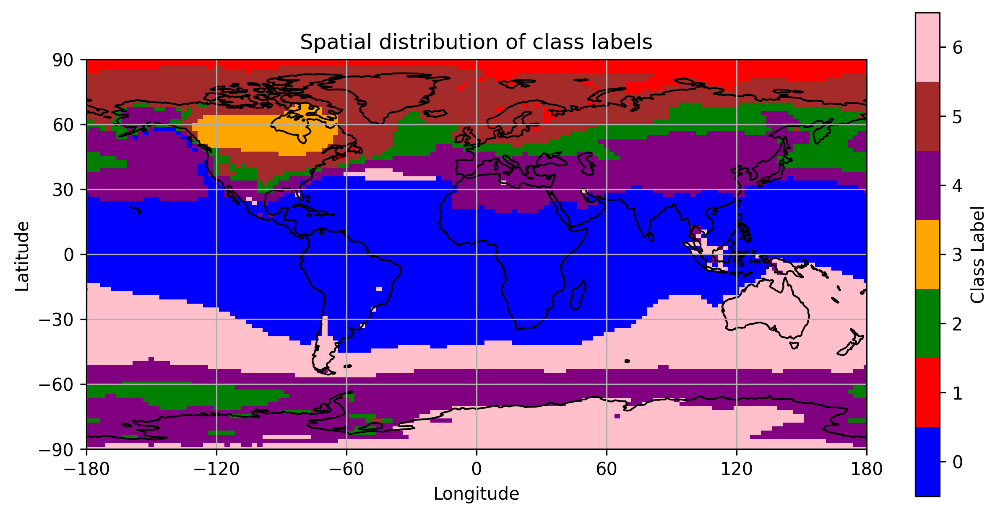

In [46]:
plot_labels(ds_sat)

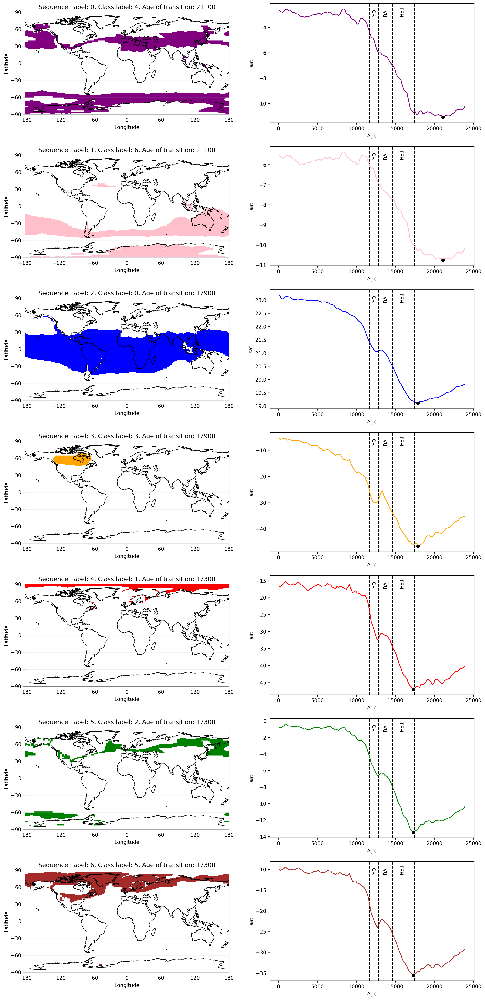

In [47]:
plot_all_label_at_sequence(ds_sat,'sat',plot_class=False)

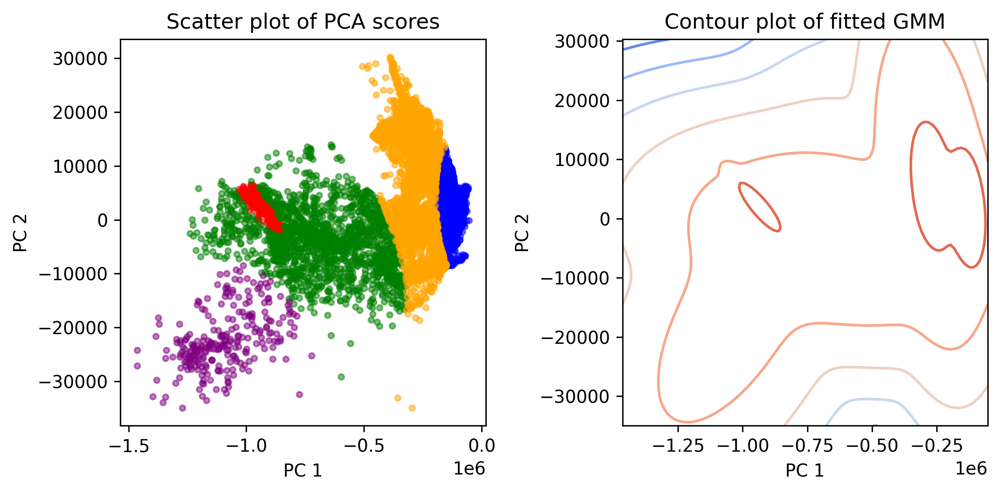

In [38]:
fit_gmm(ds_sat,'sat',n_pc=2,n_components=5)

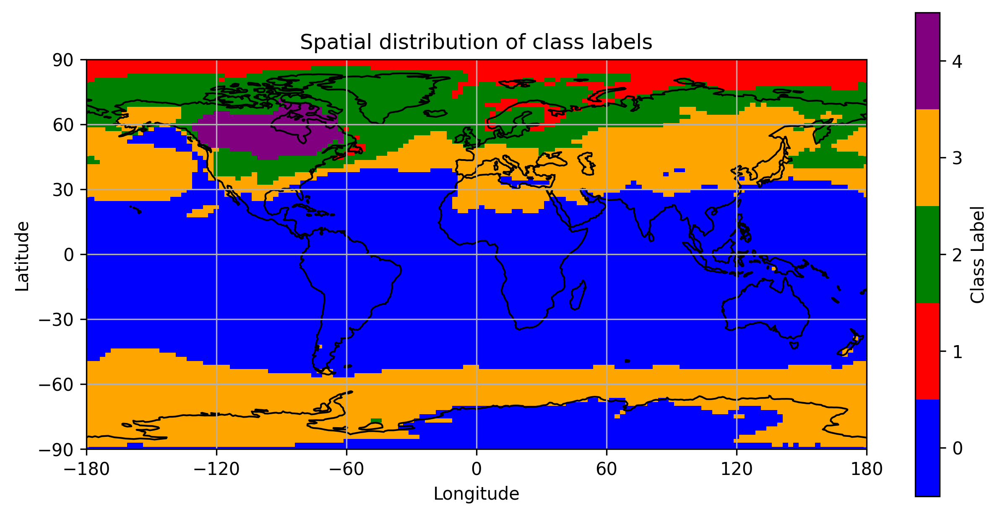

In [39]:
plot_labels(ds_sat)

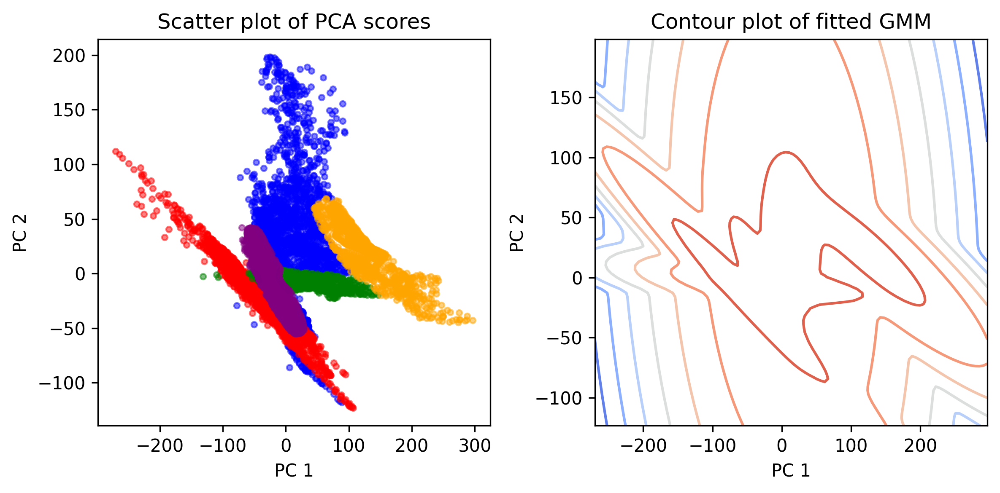

In [12]:
fit_gmm(ds_sat,'sat_anomalies',n_pc=2,n_components=5)

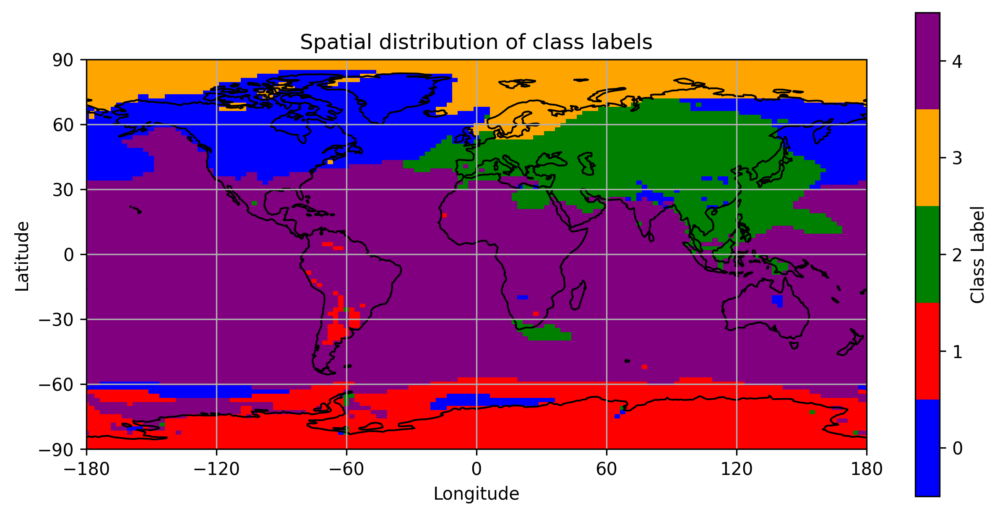

In [13]:
plot_labels(ds_sat)

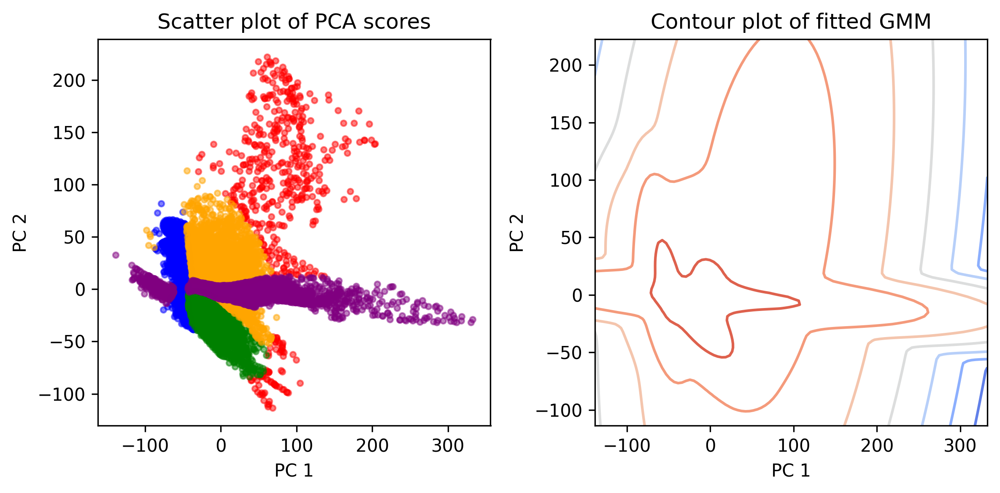

In [22]:
fit_gmm(ds_sat,'sat_anomalies_weighted',n_pc=2,n_components=5)

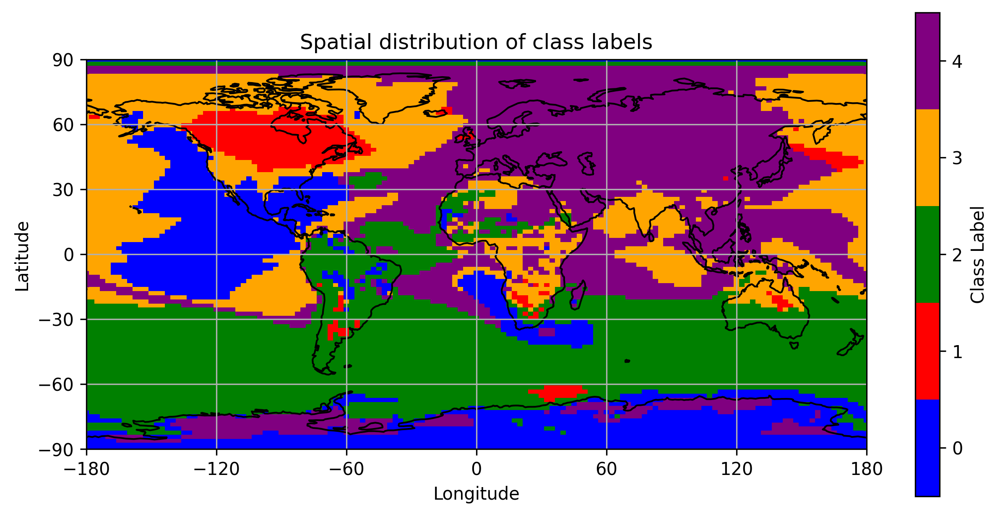

In [23]:
plot_labels(ds_sat)

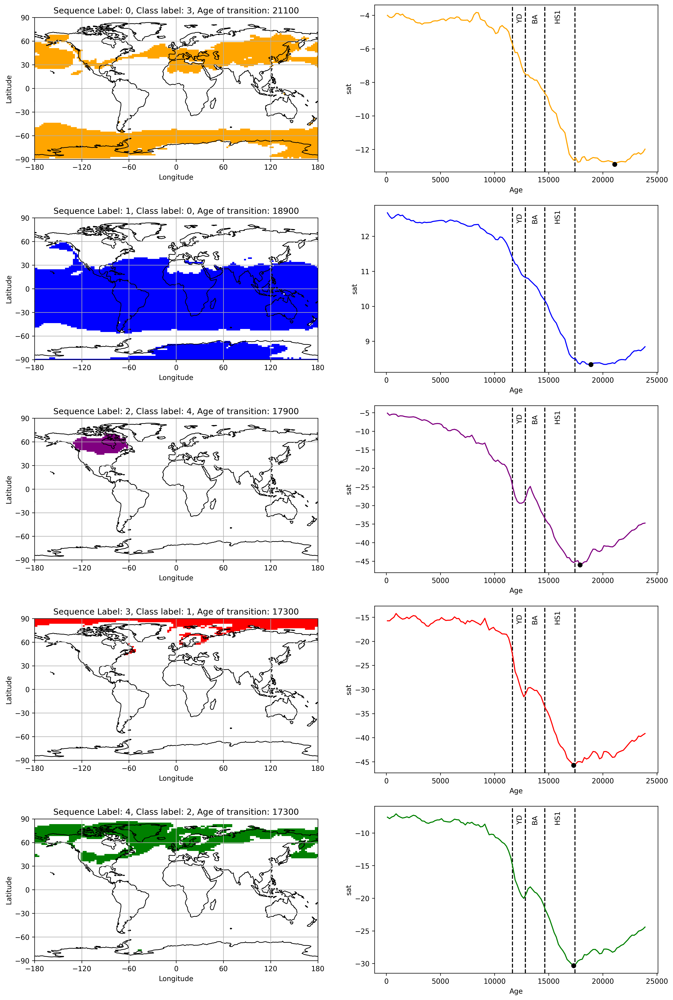

In [40]:
plot_all_label_at_sequence(ds_sat,variable='sat',plot_class=False)

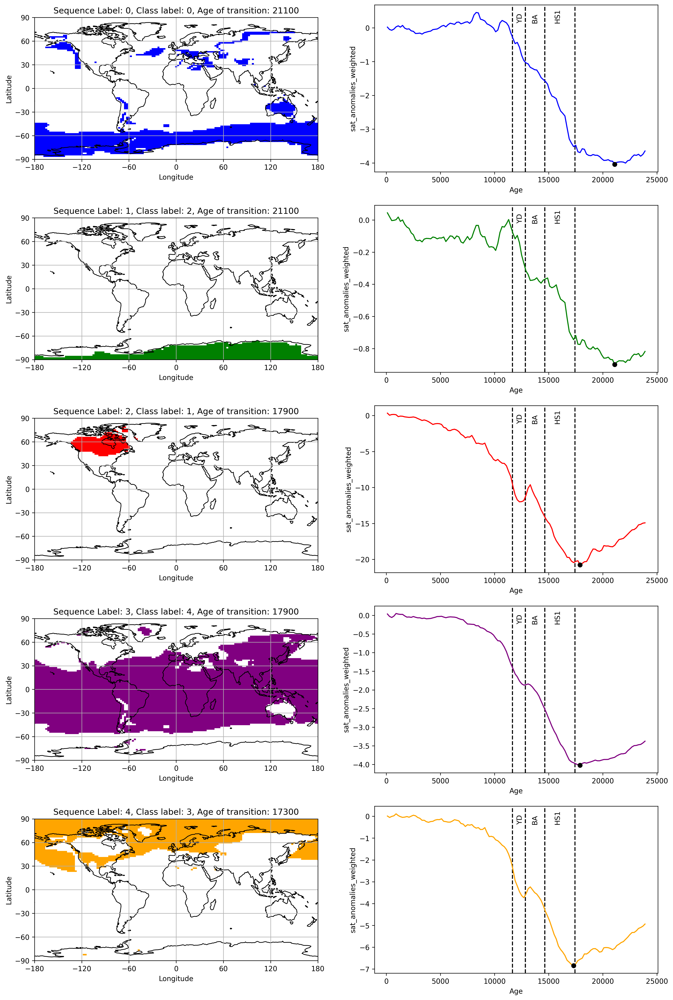

In [ ]:
plot_all_label_at_sequence(ds_sat,variable='sat_anomalies_weighted',plot_class=False)